<a href="https://colab.research.google.com/github/praveenkumarprabakar18/Classnotes/blob/main/Mr.Vamshidar_workshop_PredictiveAnalytics_MBA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import all the necessary libraries

import numpy as np # Mathematical Calculations
import pandas as pd # Data operations and summaries
import seaborn as sns # Good data visualizations
import matplotlib.pyplot as plt # basic Visualizations
import statsmodels.api as sm # Statistical Models
import warnings
warnings.simplefilter(action='ignore')
from scipy import stats
# scikit learn - Machine Learning

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
bank = pd.read_csv("Loan_Default_Mini.csv")

# Preliminary Checks

In [ ]:
len(bank) # Number of Rows in the data

In [ ]:
bank.shape # Number of rows and columns

In [ ]:

bank.head(10)# Extract the top n observations from the data

In [ ]:
bank.tail(10) # Extracts the last n observations

In [ ]:
bank.sample(10) # Randomly checking some observations in the middle

In [ ]:
bank.columns # Display the names of the columns
# Advisable to change the names of the columns especially when there is no clarity in the names or when there are spaces in the names

In [ ]:
# Renaming the column names appropriately
bank.rename(columns={ 'Status':'Target', 'year':'Loan_year','co-applicant_credit_type': 'co_applicant_credit_type' },inplace=True)# Renames the columns

In [ ]:
bank.info()# Gives information on Missing values, Data Types
# Check whether any of the columns differ in their data type from what is typically expected

In [ ]:
# Changing the data type
bank["Target"] = bank["Target"].astype("object")

In [ ]:
bank.describe()# Descriptive Statistics of the columns (Numerical columns)


In [ ]:
bank.describe(include=['O']) # Basic summary of categorical columns

In [ ]:
bank.nunique() # Unique number of values in each column

In [ ]:
bank.skew()#symmetricity of the data

In [ ]:
bank.kurtosis() # Peaked nature of the data ..The deviation of the data from normality

In [ ]:
from statsmodels.stats.descriptivestats import describe
describe(bank)

In [ ]:
cat_columns = bank.select_dtypes(include='object').columns
num_columns = bank.select_dtypes(exclude='object').columns

# Display the Frequency of each of the categories in the cateogircal columns
for var in cat_columns:
    print("Name of the Category---------", var)
    print(bank[var].value_counts())

In [ ]:
# Errors replacing them with blank values (Data Validation)

bank['rate_of_interest'][bank['rate_of_interest']<=0] = np.nan
bank['income'][bank['income'] <= 0] = np.nan
#Winsorization
# Adjust to the minimum or the maximum value

In [ ]:
# Any category with less than 30 occurrences, I will replace them with blanks

for var in cat_columns:

    insuf_Values = bank[var].value_counts()[bank[var].value_counts()<30].reset_index()
    bank[var][bank[var].isin(insuf_Values["index"])] = np.nan


In [ ]:
# Count the number of missing values ine ach column
bank.isnull().sum().sort_values(ascending=False)

Upfront_charges              1335
Interest_rate_spread         1232
rate_of_interest             1226
dtir1                         837
LTV                           545
property_value                545
income                        295
loan_limit                    115
approv_in_adv                  35
total_units                    26
open_credit                    12
submission_of_application       6
age                             6
term                            4
Neg_ammortization               2
loan_purpose                    2
Region                          0
Target                          0
Security_Type                   0
co_applicant_credit_type        0
Credit_Score                    0
credit_type                     0
ID                              0
Secured_by                      0
occupancy_type                  0
construction_type               0
Loan_year                       0
interest_only                   0
loan_amount                     0
business_or_co

In [ ]:
# In case you want to delete a column
bank.drop(["Interest_rate_spread","rate_of_interest","Upfront_charges",'ID','Loan_year','construction_type','Secured_by','Security_Type'],axis=1, inplace = True)

In [ ]:
# bank["LTV"].fillna(100, inplace=True) # Filling the missing values with some constant
bank["term"].fillna(bank['term'].min(), inplace=True) # Replace missing values with a function

In [ ]:
# Replacing a blank in a categorical variable with the mode of that category
bank["approv_in_adv"].fillna(bank['approv_in_adv'].value_counts().idxmax(), inplace=True)

In [ ]:
# Remove the missing rows
bank.dropna(axis=0, inplace = True)

In [ ]:
cat_columns = bank.select_dtypes(include='object').columns
num_columns = bank.select_dtypes(exclude='object').columns

In [ ]:
# One categorical One numerical column - Descriptive Statistics across the categories
for var in cat_columns:
    print(bank.groupby(var).mean())

              loan_amount        term  property_value        income  \
loan_limit                                                            
cf          318729.011690  333.946865   482301.275239   6719.505845   
ncf         532842.412451  332.824903   823136.186770  11149.027237   

            Credit_Score        LTV      dtir1  
loan_limit                                      
cf            701.487779  71.805745  37.776036  
ncf           698.420233  71.318585  36.583658  
                     loan_amount        term  property_value       income  \
Gender                                                                      
Female             293956.140351  338.616541   459403.508772  5503.007519   
Joint              390521.071115  336.547849   597648.814750  8521.738367   
Male               335126.728111  333.920737   493419.354839  6692.018433   
Sex Not Available  293937.437437  326.990991   444686.686687  6805.825826   

                   Credit_Score        LTV      dtir1  


In [ ]:
from itertools import product
cat1 = bank[cat_columns]
cat2 = bank[cat_columns]
cat_var_prod = list(product(cat1,cat2, repeat = 1))
cat_var_prod

[('loan_limit', 'loan_limit'),
 ('loan_limit', 'Gender'),
 ('loan_limit', 'approv_in_adv'),
 ('loan_limit', 'loan_type'),
 ('loan_limit', 'loan_purpose'),
 ('loan_limit', 'Credit_Worthiness'),
 ('loan_limit', 'open_credit'),
 ('loan_limit', 'business_or_commercial'),
 ('loan_limit', 'Neg_ammortization'),
 ('loan_limit', 'interest_only'),
 ('loan_limit', 'lump_sum_payment'),
 ('loan_limit', 'occupancy_type'),
 ('loan_limit', 'total_units'),
 ('loan_limit', 'credit_type'),
 ('loan_limit', 'co_applicant_credit_type'),
 ('loan_limit', 'age'),
 ('loan_limit', 'submission_of_application'),
 ('loan_limit', 'Region'),
 ('loan_limit', 'Target'),
 ('Gender', 'loan_limit'),
 ('Gender', 'Gender'),
 ('Gender', 'approv_in_adv'),
 ('Gender', 'loan_type'),
 ('Gender', 'loan_purpose'),
 ('Gender', 'Credit_Worthiness'),
 ('Gender', 'open_credit'),
 ('Gender', 'business_or_commercial'),
 ('Gender', 'Neg_ammortization'),
 ('Gender', 'interest_only'),
 ('Gender', 'lump_sum_payment'),
 ('Gender', 'occupancy

In [ ]:
import scipy.stats as ss
result = []
for i in cat_var_prod:
    if i[0] != i[1]:
        result.append((i[0],i[1],list(ss.chi2_contingency(pd.crosstab(
                            bank[i[0]], bank[i[1]])))[1]))
result
chi_test_output = pd.DataFrame(result, columns = ["var1", "var2", "p-value"])
chi_test_output

,var1,var2,p-value
0,loan_limit,Gender,2.516297e-01
1,loan_limit,approv_in_adv,9.036447e-10
2,loan_limit,loan_type,1.327439e-01
3,loan_limit,loan_purpose,7.346106e-01
4,loan_limit,Credit_Worthiness,6.900471e-01
5,loan_limit,open_credit,1.000000e+00
6,loan_limit,business_or_commercial,2.038075e-01
7,loan_limit,Neg_ammortization,2.878366e-01
8,loan_limit,interest_only,9.586223e-02
9,loan_limit,lump_sum_payment,6.311252e-01


In [ ]:
# Correlation between two numerical variables
bank.corr()

In [ ]:
def Zscore_outlier(df):
    out=[]
    m = np.mean(df)
    sd = np.std(df)
    for i in df:
        z = (i-m)/sd
        if np.abs(z) > 10:
            out.append(i)
    print("Outliers:",out)
    print("Number of Outliers:",len(out))

for var in num_columns:
    print(var)
    print(Zscore_outlier(bank[var]))

In [ ]:
def iqr_outliers(df):
    out=[]
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    iqr = q3-q1
    Lower_tail = q1 - 3 * iqr
    Upper_tail = q3 + 3 * iqr
    for i in df:
        if i > Upper_tail or i < Lower_tail:
            out.append(i)
    print("Outliers:",out)
    print("Number of Outliers:",len(out))

for var in num_columns:
    print(var)
    print(iqr_outliers(bank[var]))

In [ ]:
def Winsorization_outliers(df):
    out=[]
    q1 = df.quantile(0.005)
    q3 = df.quantile(0.995)
    for i in df:
        if i > q3 or i < q1:
            out.append(i)
    print(var)
    print("q1:", q1, "q3:",q3)
    print("Outliers:",out)
    print("Number of Outliers:",len(out))

for var in num_columns:
    print(Winsorization_outliers(bank[var]))

In [ ]:
def ZRscore_outlier(df):
    out=[]
    med = np.median(df)
    ma = stats.median_abs_deviation(df)
    for i in df:
        z = (0.6745*(i-med))/ (np.median(ma))
        if np.abs(z) > 4:
            out.append(i)
    print("Outliers:",out)
    print("Number of Outliers:",len(out))

for var in num_columns:
    print(ZRscore_outlier(bank[var]))

In [ ]:
# Multivariate Outliers

from sklearn.cluster import DBSCAN
def DB_outliers(df):
    outlier_detection = DBSCAN(eps = 2, metric='euclidean', min_samples = 5)
    clusters = outlier_detection.fit_predict(df.values.reshape(-1,1))
    data = pd.DataFrame()
    data['cluster'] = clusters
    print(data['cluster'].value_counts().sort_values(ascending=False))

for var in num_columns:
    print(var)
    print(DB_outliers(bank[var]))

In [ ]:
# Identifying outliers based on Random Forests

from sklearn.ensemble import IsolationForest
def Iso_outliers(df):
    iso = IsolationForest(random_state = 1, contamination= 'auto')
    preds = iso.fit_predict(df.values.reshape(-1,1))
    data = pd.DataFrame()
    data['cluster'] = preds
    print(data['cluster'].value_counts().sort_values(ascending=False))

for var in num_columns:
    Iso_outliers(bank[var])

## Visualizations

In [ ]:
# Numerical Columns - Univariate - Histogram with Density Plot
for var in num_columns:
    plt.figure()
    sns.histplot(data = bank, x = var, kde = True, color='teal', alpha=0.6)
    sns.kdeplot

In [ ]:
# Numerical Columns - Univariate - BoxPlot
for var in num_columns:
    plt.figure()
    sns.boxplot(data = bank, x = var, color='teal')

In [ ]:
# Categorical Columns - Univariate - Simple Frequency Chart
plt.figure(figsize=(15,8))
for var in cat_columns:
    plt.figure()
    sns.countplot(data = bank, x = var)

In [ ]:
# Categorical Columns - Bivariate - Simple Frequency Chart distributed across categories
plt.figure(figsize=(15,8))
for var in cat_columns:
    plt.figure()
    sns.countplot(data = bank, x = "Target", hue = var)

In [ ]:
# Numerical - Numerical Scatter Plot - Scatter Plot Matrix # Subdivided by the Target Variable
sns.pairplot(bank)

In [ ]:
# Numerical - Numerical Regression Plot -
for var1 in num_columns:
    for var2 in num_columns:
        plt.figure()
        sns.regplot(data = bank, x = var1, y = var2, color='teal')

In [ ]:
# Numerical - Numerical Scatter Plot - Scatter Plot Matrix # Subdivided by the Target Variable
sns.pairplot(bank, hue = "Target")

In [ ]:
for var in num_columns:
    for i in cat_columns:
        plt.figure()
        sns.catplot(x=i,y=var,data=bank,kind='box',col='Target',palette='Dark2')

In [ ]:
# Heatmap representation of correlation
sns.heatmap(bank.corr(), annot=True, cmap = "viridis")

<Figure size 1000x400 with 0 Axes>

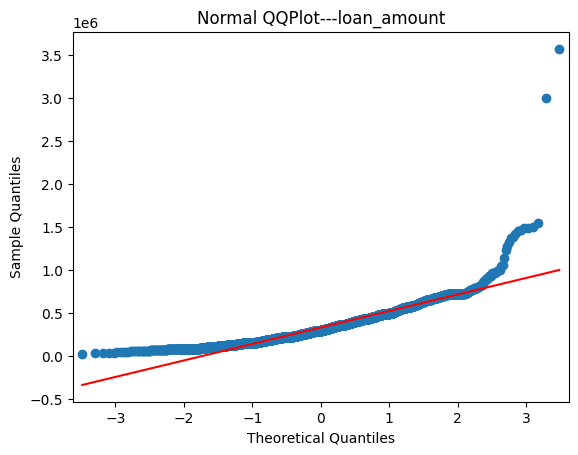

<Figure size 1000x400 with 0 Axes>

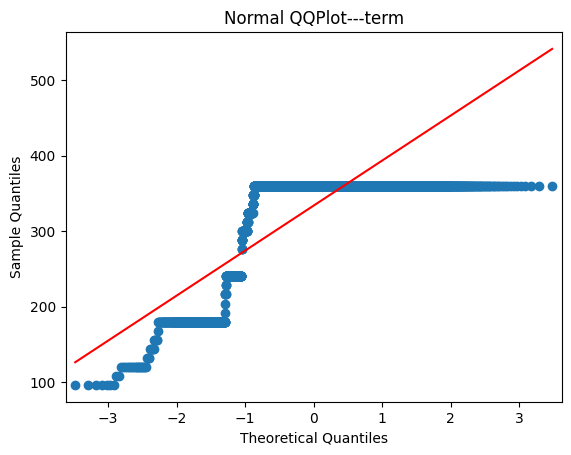

<Figure size 1000x400 with 0 Axes>

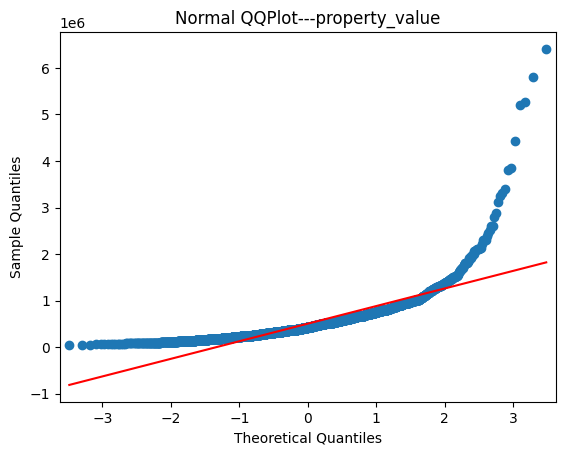

<Figure size 1000x400 with 0 Axes>

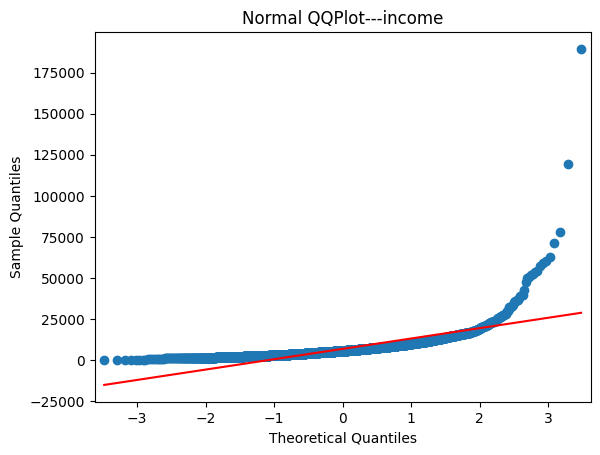

<Figure size 1000x400 with 0 Axes>

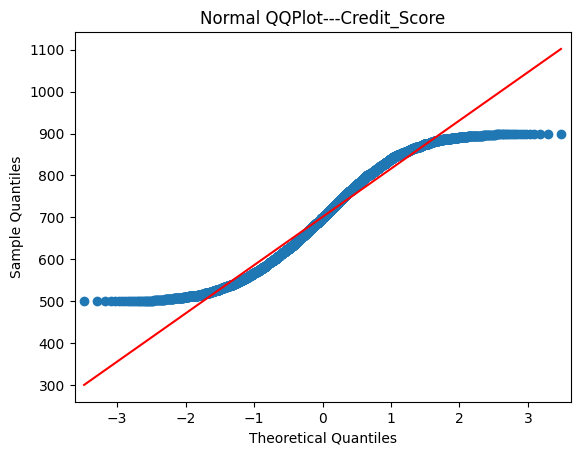

<Figure size 1000x400 with 0 Axes>

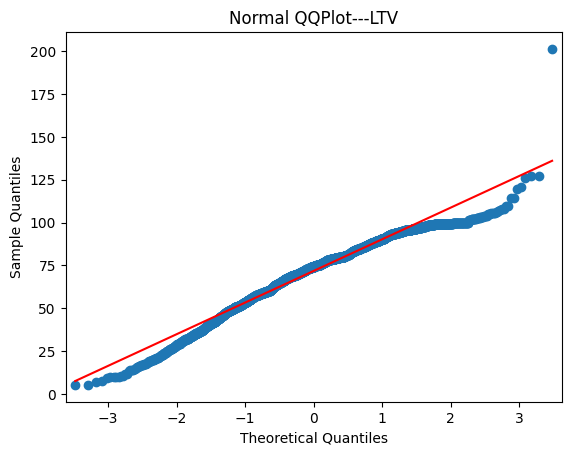

<Figure size 1000x400 with 0 Axes>

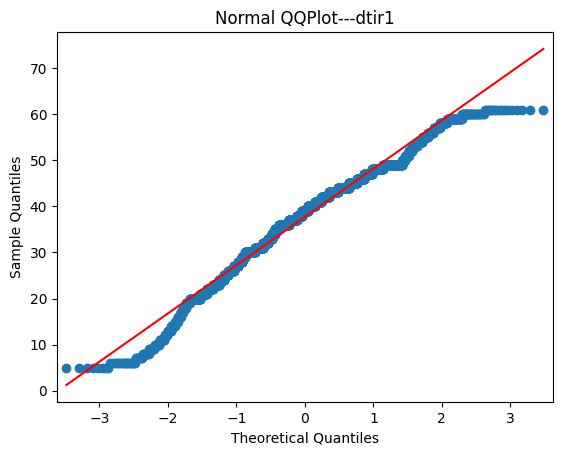

In [ ]:
import statsmodels.api as sm
def qq_plots(df):
    plt.figure(figsize=(10, 4))
    sm.qqplot(df,line='s')
    plt.title("Normal QQPlot---"+var)
    plt.show()
for var in num_columns:
    qq_plots(bank[var])


## Scikit-Learn

In [ ]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler,PowerTransformer,QuantileTransformer
from sklearn.feature_selection import VarianceThreshold

In [ ]:
bank['Target'] = bank['Target'].replace(['no','yes'],['0','1'])

In [ ]:
# Separate the features variables from the Target Variables

X = bank.drop(["Target"],axis = 1)
y = bank['Target']

In [ ]:
# Have a list of categorical and numerical columns

categorical_columns = X.select_dtypes(include='object').columns
numerical_columns = X.select_dtypes(exclude='object').columns

In [ ]:
# Encoding Categorical Variables on the entire Feature data

X = pd.get_dummies(data = X, prefix = categorical_columns, prefix_sep='_',
               columns = categorical_columns,
               drop_first =True,
              dtype='int8')
X

,loan_amount,term,property_value,income,Credit_Score,LTV,dtir1,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,approv_in_adv_pre,loan_type_type2,loan_type_type3,loan_purpose_p2,loan_purpose_p3,loan_purpose_p4,Credit_Worthiness_l2,business_or_commercial_nob/c,Neg_ammortization_not_neg,interest_only_not_int,lump_sum_payment_not_lpsm,occupancy_type_pr,occupancy_type_sr,total_units_2U,credit_type_CRIF,credit_type_EXP,co_applicant_credit_type_EXP,age_35-44,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south
0,116500,360.0,118000.0,1740.0,758,98.728814,45.0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1
2,406500,360.0,508000.0,9480.0,834,80.019685,46.0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1
3,456500,360.0,658000.0,11880.0,587,69.376900,42.0,0,0,1,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
4,696500,360.0,758000.0,10440.0,602,91.886544,39.0,0,1,0,0,1,0,0,0,0,0,0,1,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
5,706500,360.0,1008000.0,10080.0,864,70.089286,40.0,0,1,0,0,1,0,0,0,0,0,0,1,1,1,1,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
6,346500,360.0,438000.0,5040.0,860,79.109589,44.0,0,1,0,0,1,0,0,0,1,0,0,1,1,1,1,1,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0
8,376500,360.0,478000.0,5580.0,580,78.765690,44.0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0
9,436500,360.0,688000.0,6720.0,788,63.444767,30.0,0,0,0,1,0,0,1,0,1,0,0,1,1,1,1,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1
10,136500,300.0,168000.0,4020.0,723,81.250000,44.0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
11,466500,360.0,708000.0,9540.0,501,65.889831,36.0,0,0,0,1,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,1,1,1,0,0,0,0,0,1,0,0,1


In [ ]:
# Splitting the data into training and testing

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
# Capture the columns of training data

col_names = X_train.columns

In [ ]:
X_train

,loan_amount,term,property_value,income,Credit_Score,LTV,dtir1,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,approv_in_adv_pre,loan_type_type2,loan_type_type3,loan_purpose_p2,loan_purpose_p3,loan_purpose_p4,Credit_Worthiness_l2,business_or_commercial_nob/c,Neg_ammortization_not_neg,interest_only_not_int,lump_sum_payment_not_lpsm,occupancy_type_pr,occupancy_type_sr,total_units_2U,credit_type_CRIF,credit_type_EXP,co_applicant_credit_type_EXP,age_35-44,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south
4493,316500,360.0,548000.0,4860.0,884,57.755474,41.0,0,1,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0
3364,136500,180.0,178000.0,6000.0,563,76.685393,26.0,0,0,0,1,0,0,0,0,0,1,1,1,1,1,1,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1
992,626500,360.0,958000.0,6600.0,602,65.396660,44.0,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0
2157,656500,360.0,3308000.0,35820.0,534,19.845828,16.0,0,0,1,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1
3067,296500,180.0,378000.0,9360.0,714,78.439153,49.0,1,1,0,0,1,0,0,0,1,0,0,1,1,1,1,1,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0
2146,356500,360.0,518000.0,3480.0,609,68.822394,44.0,0,0,1,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0
4534,126500,360.0,228000.0,2460.0,874,55.482456,43.0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1
3316,166500,180.0,218000.0,11580.0,513,76.376147,40.0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1
2061,326500,360.0,508000.0,3780.0,887,64.271654,44.0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
186,96500,360.0,138000.0,3180.0,812,69.927536,46.0,0,0,1,0,0,1,0,0,1,0,0,0,1,1,1,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0


In [ ]:
X_test

,loan_amount,term,property_value,income,Credit_Score,LTV,dtir1,loan_limit_ncf,Gender_Joint,Gender_Male,Gender_Sex Not Available,approv_in_adv_pre,loan_type_type2,loan_type_type3,loan_purpose_p2,loan_purpose_p3,loan_purpose_p4,Credit_Worthiness_l2,business_or_commercial_nob/c,Neg_ammortization_not_neg,interest_only_not_int,lump_sum_payment_not_lpsm,occupancy_type_pr,occupancy_type_sr,total_units_2U,credit_type_CRIF,credit_type_EXP,co_applicant_credit_type_EXP,age_35-44,age_45-54,age_55-64,age_65-74,age_<25,age_>74,submission_of_application_to_inst,Region_North-East,Region_central,Region_south
1588,426500,336.0,678000.0,4440.0,574,62.905605,45.0,0,1,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1
3220,546500,360.0,898000.0,6960.0,878,60.857461,48.0,0,1,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4743,646500,360.0,1158000.0,6900.0,510,55.829016,46.0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0
4041,76500,360.0,208000.0,1800.0,785,36.778846,36.0,0,0,1,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0
3272,106500,360.0,158000.0,3240.0,605,67.405063,40.0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1564,326500,360.0,438000.0,6540.0,661,74.543379,29.0,0,1,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0,1,0
2572,306500,360.0,328000.0,3360.0,891,93.445122,41.0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1630,246500,360.0,628000.0,4020.0,884,39.251592,43.0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1
1571,316500,360.0,758000.0,3300.0,539,41.754617,49.0,0,0,1,0,0,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2801,116500,300.0,158000.0,3180.0,786,73.734177,40.0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0


## Feature Selection

### Constant Features Removal (Zero Variance Removal)

In [ ]:
# Filter out any variables with a single constant value

constant_filter = VarianceThreshold(threshold=0)
constant_filter.fit(X_train)

In [ ]:
X_train

In [ ]:
constant_filter.get_support().sum()

In [ ]:
constant_list = [not temp for temp in constant_filter.get_support()]
constant_list

In [ ]:
constant_filter.get_support()

In [ ]:
col_names = col_names[constant_filter.get_support()]

In [ ]:
X_train = pd.DataFrame(constant_filter.transform(X_train),columns = col_names)
X_test = pd.DataFrame(constant_filter.transform(X_test),columns = col_names)

In [ ]:
X_train

### Quasi Constant Removal (Near Zero Variance)

In [ ]:
0.995*0.005

In [ ]:
# Set the threshold for Near Zero Variance and run it on the training data

quasi_constant_filter = VarianceThreshold(threshold=0.001)
quasi_constant_filter.fit(X_train)

In [ ]:
# Find the number of variables that get retained and collect their column names
quasi_constant_filter.get_support().sum()
col_names = col_names[quasi_constant_filter.get_support()]

In [ ]:
quasi_constant_filter.get_support().sum()

In [ ]:
# Remove the eliminated columns from both the training and the testing data and retain only the survived columns

X_train = pd.DataFrame(quasi_constant_filter.transform(X_train),columns = col_names)
X_test = pd.DataFrame(quasi_constant_filter.transform(X_test), columns = col_names)

In [ ]:
X_train.head()

### Remove Duplicate Features

In [ ]:
# Transpose the rows to columns and vice versa
X_train_T = X_train.T
X_test_T = X_test.T

In [ ]:
# Convert the matrix to a Data Frame
X_train_T = pd.DataFrame(X_train_T)
X_test_T = pd.DataFrame(X_test_T)

In [ ]:
X_train_T.shape, X_test_T.shape

In [ ]:
# Count the number of duplicated rows

X_train_T.duplicated().sum()

In [ ]:
# Get the names of duplicated features
duplicated_features = X_train_T.duplicated()
duplicated_features

In [ ]:
# Remove the features that are identified as duplicates and retain the remaining ones
features_to_keep = [not index for index in duplicated_features]

In [ ]:
# Gather the names of the retained columns
col_names = col_names[features_to_keep]

In [ ]:
# Filter the data by removing the duplicate column
X_train = pd.DataFrame(X_train_T[features_to_keep].T,columns = col_names)
X_test = pd.DataFrame(X_test_T[features_to_keep].T,columns = col_names)

In [ ]:
X_train.head()

### Correlated Feature Removal

In [ ]:
# Take paiwise correlation

corrmat = X_train.corr()

In [ ]:
# Heat Map of the correlation

plt.figure(figsize=(50,25))
sns.heatmap(corrmat, annot = True, cmap = 'viridis')

In [ ]:
# Function to capture pair wise correlations greater than a set threshold

def get_correlation(data, threshold):
    corr_col = set()
    corrmat = data.corr()
    for i in range(len(corrmat.columns)):
        for j in range(i):
            if abs(corrmat.iloc[i, j])> threshold:
                colname = corrmat.columns[i]
                corr_col.add(colname)
    return corr_col

In [ ]:
corr_features_1 = get_correlation(X_train, 1)
corr_features_1

In [ ]:
col_names

In [ ]:
# Simple outright dropping of the correlated columns
X_train = X_train.drop(labels=corr_features_1, axis = 1)
X_test = X_test.drop(labels = corr_features_1, axis = 1)

In [ ]:
col_names = col_names.drop(corr_features_1)

In [ ]:
X_train.columns = col_names
X_test.columns = col_names

In [ ]:
X_train.head()

### Feature Grouping and Feature Importance

In [ ]:
# Take paiwise correlation

corrmat = X_train.corr()

In [ ]:
corr_features_1 = get_correlation(X_train, 0.95)
corr_features_1

In [ ]:
# Convert the correlation matrix into a columnal form
corrdata = corrmat.abs().stack()
corrdata

In [ ]:
corrdata = corrdata.sort_values(ascending=False)
corrdata

In [ ]:
corrdata = corrdata[corrdata>0.95]
corrdata = corrdata[corrdata<1]
corrdata

In [ ]:
corrdata = pd.DataFrame(corrdata).reset_index()
corrdata.columns = ['features1', 'features2', 'corr_value']
corrdata

In [ ]:
# Groups of the correlated features

grouped_feature_list = []
correlated_groups_list = []
for feature in corrdata.features1.unique():
    if feature not in grouped_feature_list:
        correlated_block = corrdata[corrdata.features1 == feature]
        grouped_feature_list = grouped_feature_list + list(correlated_block.features2.unique()) + [feature]
        correlated_groups_list.append(correlated_block)

In [ ]:
correlated_groups_list

In [ ]:
for group in correlated_groups_list:
    print(group)

In [ ]:
# Feature importance using RF classifier

from sklearn.ensemble import RandomForestClassifier
important_features = []
for group in correlated_groups_list:
    features = list(group.features1.unique()) + list(group.features2.unique())
    #features = col_names[features]
    rf = RandomForestClassifier(n_estimators=100, random_state=0)
    y_train=y_train.astype('int')
    rf.fit(X_train[features], y_train)

    importance = pd.concat([pd.Series(features), pd.Series(rf.feature_importances_)], axis = 1)
    importance.columns = ['features', 'importance']
    importance.sort_values(by = 'importance', ascending = False, inplace = True)
    feat = importance.iloc[0]
    important_features.append(feat)


In [ ]:
important_features

In [ ]:
important_features = pd.DataFrame(important_features)

In [ ]:
important_features.reset_index(inplace=True, drop = True)

In [ ]:
important_features

In [ ]:
features_to_consider = set(important_features)

In [ ]:
features_to_discard = set(corr_features_1) - set(features_to_consider)

In [ ]:
features_to_discard = list(features_to_discard)

In [ ]:
features_to_discard

In [ ]:
X_train = X_train.drop(labels = features_to_discard, axis = 1)
X_train.shape

In [ ]:
X_test = X_test.drop(labels=features_to_discard, axis = 1)
X_test.shape

In [ ]:
X_train.head()

## Other univariate feature Selection

### Feature selection based on Chi Square test

In [ ]:
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest, SelectPercentile

In [ ]:
sel = chi2(X_train, y_train)
sel

In [ ]:
p_values = pd.Series(sel[1])
p_values.index = X_train.columns
p_values.sort_values(ascending = True, inplace = True)

In [ ]:
p_values.plot.bar(figsize = (16, 5))

In [ ]:
p_values = p_values[p_values<0.05]

In [ ]:
p_values.index

In [ ]:
X_train_p = X_train[p_values.index]
X_test_p = X_test[p_values.index]

In [ ]:
X_train_p.head()

In [ ]:
new_cols = X_train.columns
new_cols

### Feature selection based on mutual information

In [ ]:
from sklearn.feature_selection import VarianceThreshold, mutual_info_classif, mutual_info_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile

In [ ]:
mi = mutual_info_classif(X_train, y_train.astype(int))

In [ ]:
mi = pd.Series(mi)
mi.index = X_train.columns
mi.sort_values(ascending=False, inplace = True)

In [ ]:
mi.plot.bar(figsize = (16,5))

In [ ]:
mi

In [ ]:
sel = mi[mi.values>0.0001].index
sel

In [ ]:
X_train = X_train[sel]
X_test = X_test[sel]

In [ ]:
X_train.head()

## Feature selection based on F Score

In [ ]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile

In [ ]:
sel = f_classif(X_train, y_train)
sel

In [ ]:
p_values = pd.Series(sel[1])
p_values.index = X_train.columns
p_values.sort_values(ascending = True, inplace = True)

In [ ]:
p_values.plot.bar(figsize = (16, 5))

In [ ]:
p_values = p_values[p_values<0.05]

In [ ]:
p_values.index

In [ ]:
X_train_p = X_train[p_values.index]
X_test_p = X_test[p_values.index]

In [ ]:
X_train_p.head()

In [ ]:
new_cols = X_train.columns
new_cols

### using PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=5, random_state=42)
pca.fit(X_train)

In [ ]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)
X_train_pca.shape, X_test_pca.shape

In [ ]:
X_train_pca

## Feature Transformation

In [ ]:
# You can perform Box Cox or Yeo-Johnson (Non Normal transformation)
bctrans = PowerTransformer(method = 'yeo-johnson').fit(X_train)
X_train = pd.DataFrame(bctrans.transform(X_train), columns = new_cols)
X_test = pd.DataFrame(bctrans.transform(X_test), columns = new_cols)
X_train.head()

In [ ]:
X_train.skew()

In [ ]:
X_train.kurt()

In [ ]:
X_train.describe()

In [ ]:
scaler = preprocessing.StandardScaler().fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train),columns = new_cols)
X_test = pd.DataFrame(scaler.transform(X_test),columns = new_cols)
X_train.head()

In [ ]:
y_train = y_train.astype('int')
y_test = y_test.astype('int')

## Basic Perceptron

In [ ]:
from sklearn.linear_model import Perceptron
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, cohen_kappa_score, confusion_matrix, f1_score, precision_recall_curve, precision_score, recall_score, roc_auc_score, roc_curve,ConfusionMatrixDisplay , precision_recall_curve, RocCurveDisplay

In [ ]:
# Execute the Default model
model = Perceptron()
model.fit(X_train,y_train)
model.coef_

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
y_train.value_counts()

In [ ]:
4079/(4079+3731)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
#y_pred_proba = model.predict_proba(X_test)

In [ ]:
2*0.65625*0.7413350449293966/(0.65625+0.7413350449293966)

In [ ]:
pd.DataFrame(y_test).value_counts()

In [ ]:
1558/(1558+1790)

In [ ]:
1-0.46535244922341695

In [ ]:
# Print Some importance performance measures
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(cohen_kappa_score(y_test,y_pred))
#print(roc_auc_score(y_test, y_pred_proba[:,1]))
#plot_roc_curve(model,X_test,y_test)
ConfusionMatrixDisplay.from_predictions(y_test,y_pred)

## Logistic Regression

In [ ]:
t = np.linspace(-100, 100, 1000)
sig = 1 / (1 + np.exp(-t))
plt.figure(figsize=(9, 3))
plt.plot(t, sig, "b-", linewidth=2, label=r"$\sigma(t) = \frac{1}{1 + e^{-t}}$")
plt.xlabel("t")
plt.legend(loc="upper left", fontsize=20)
plt.axis([-10, 10, -0.1, 1.1])
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, cohen_kappa_score, confusion_matrix, f1_score, precision_recall_curve, precision_score, recall_score, roc_auc_score, roc_curve, ConfusionMatrixDisplay, plot_precision_recall_curve, plot_roc_curve

In [ ]:
model = LogisticRegression()
model.fit(X_train,y_train)

In [ ]:
X_train.columns

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
pd.DataFrame(y_train).value_counts()

In [ ]:
4079/(4079+3731)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
# Cross Validation as a better process over train-test split
from sklearn.model_selection import cross_val_score
scores_accuracy = cross_val_score(model, X, y, cv=10, scoring='accuracy')
scores_balanced_accuracy = cross_val_score(model, X, y, cv=10, scoring='balanced_accuracy')
scores_auc = cross_val_score(model, X, y, cv=10, scoring='roc_auc')
scores_accuracy.mean(),scores_balanced_accuracy.mean(), scores_auc.mean()

In [ ]:
scores_accuracy,scores_balanced_accuracy,scores_auc

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'penalty':['l1','l2','elasticnet','none'],
              'C':[0.01,0.1,1,10,100],
              'fit_intercept':[True, False]}

In [ ]:
# Initiate your model
model = LogisticRegression()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
grid_search_acc = LogisticRegression(C = 1, fit_intercept= False, penalty= 'l2')
grid_search_acc.fit(X_train,y_train)

In [ ]:
y_pred = grid_search_acc.predict(X_test)

In [ ]:
grid_search_acc

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

In [ ]:
import statsmodels.api as sm

In [ ]:
y_train

In [ ]:
y_train = y_train.values.reshape(-1,1)
# building the model and fitting the data
log_reg = sm.Logit(y_train, X_train).fit()

In [ ]:
# printing the summary table
print(log_reg.summary())

In [ ]:
# performing predictions on the test datdaset
yhat = log_reg.predict(X_test)
prediction = list(map(round, yhat))

In [ ]:
print(accuracy_score(y_test,prediction))

## KNN Classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model = KNeighborsClassifier()
model.fit(X_train,y_train)

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'n_neighbors':[3,5,9,15,25],
              'weights':['uniform','distance'],
              'p':[1,2,3]
              }

In [ ]:
# Initiate your model
model = KNeighborsClassifier()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
y_pred = grid_search_auc.predict(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

In [ ]:
np.round(np.sqrt(X_train.shape[0]),0)

In [ ]:
neighbors = np.arange(1, int(np.round(np.sqrt(X_train.shape[0]),0)))
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))


for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_accuracy[i] = knn.score(X_train, y_train)
    test_accuracy[i] = knn.score(X_test, y_test)

    # Generate plot
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')

plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()
test_accuracy

# Support Vector Machines

In [ ]:
from sklearn.svm import SVC

In [ ]:
model = SVC(probability = True)
model.fit(X_train,y_train)

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
# Cross Validation as a better process over train-test split
from sklearn.model_selection import cross_val_score
scores_accuracy = cross_val_score(model, X_train, y_train, cv=10, scoring='accuracy')
scores_balanced_accuracy = cross_val_score(model, X_train, y_train, cv=10, scoring='balanced_accuracy')
scores_auc = cross_val_score(model, X_train, y_train, cv=10, scoring='roc_auc')
scores_accuracy.mean(),scores_balanced_accuracy.mean(), scores_auc.mean()

In [ ]:
scores_accuracy,scores_balanced_accuracy,scores_auc

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'criterion':['gini','entropy'],
              'max_depth':['None',2,3,4,5],
              'max_features':['auto',2,3,5,8],
              'min_samples_split':[2,3,5,8],
              'n_estimators': [25,50,100,200,400]
              }

In [ ]:
# Initiate your model
model = RandomForestClassifier()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
y_pred = grid_search_acc.predict(X_test)

In [ ]:
grid_search_acc

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

# Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
model = DecisionTreeClassifier()
model.fit(X_train,y_train)

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'criterion':['gini','entropy','log_loss'],
              'max_depth':[2,3,4,5,"None"],
              'min_samples_split':[2,3,5,8],
              'min_samples_leaf':[1,3,5]}

In [ ]:
# Initiate your model
model = DecisionTreeClassifier()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
y_pred = grid_search_acc.predict(X_test)

In [ ]:
grid_search_acc

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

# Random Forest Classification

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier()
model.fit(X_train,y_train)

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'criterion':['gini','entropy'],
              'max_depth':['None',2,3,5],
              'max_features':['auto',2,3,5],
              'min_samples_split':[2,3,5],
              'n_estimators': [50,100,200]
              }

In [ ]:
# Initiate your model
model = RandomForestClassifier()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
y_pred = grid_search_acc.predict(X_test)

In [ ]:
grid_search_acc

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

In [ ]:
### Visualize decision Trees

In [ ]:
model = DecisionTreeClassifier(criterion = 'gini', max_depth = 4, max_features= 8, min_samples_split= 2)
model.fit(X_train,y_train)
from sklearn import tree
text_representation = tree.export_text(model)
print(text_representation)

In [ ]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(model,
                   feature_names=X_train.columns,
                   filled=True)

In [ ]:
fig.savefig("decistion_tree.png")

# Gradient Booosting Classification

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()
model.fit(X_train,y_train)

In [ ]:
# Accuracy on training data
model.score(X_train,y_train)

In [ ]:
# Predict the model on the Testing Data
y_pred = model.predict(X_test)
# Predict probabilities of belonging to each of the groups
y_pred_proba = model.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(model,X_test,y_test)

In [ ]:
scores_accuracy,scores_balanced_accuracy,scores_auc

In [ ]:
# Hyper parameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'max_depth':['None',2,3,4,5],
              'max_features':['auto',2,3,5,8],
              'min_samples_split':[2,3,5,8],
              'n_estimators': [25,50,100,200,400],
               'learning_rate': [0.01,0.05,0.1,0.2,0.5]
              }

In [ ]:
# Initiate your model
model = GradientBoostingClassifier()
# Get a list of all possible parameters

grid_search_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'accuracy',
                           cv = 10,
                           verbose=0)
grid_search_Bal_acc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'balanced_accuracy',
                           cv = 10,
                           verbose=0)
grid_search_auc = GridSearchCV(estimator = model,
                           param_grid = param_grid,
                           scoring = 'roc_auc',
                           cv = 10,
                           verbose=0)
grid_search_acc.fit(X_train, y_train)
grid_search_Bal_acc.fit(X_train, y_train)
grid_search_auc.fit(X_train, y_train)

In [ ]:
print(grid_search_acc.best_params_)
print(grid_search_Bal_acc.best_params_)
print(grid_search_auc.best_params_)

In [ ]:
y_pred = grid_search_acc.predict(X_test)

In [ ]:
grid_search_acc

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
print(confusion_matrix(y_test, y_pred))
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test, y_pred_proba[:,1]))

## XGBOOST

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier(use_label_encoder=False,
                      booster='gbtree', # boosting algorithm to use, default gbtree, othera: gblinear, dart
                      n_estimators=100, # number of trees, default = 100
                      eta=0.3, # this is learning rate, default = 0.3
                      max_depth=6, # maximum depth of the tree, default = 6
                      gamma = 0, # used for pruning, if gain < gamma the branch will be pruned, default = 0
                      reg_lambda = 1, # regularization parameter, defautl = 1
                      #min_child_weight=0 # this refers to Cover which is also responsible for pruning if not set to 0
                     )


In [ ]:
clf = model.fit(X_train, y_train)

In [ ]:
# Predict class labels on training data
pred_labels_tr = model.predict(X_train)
# Predict class labels on a test data
pred_labels_te = model.predict(X_test)

In [ ]:
score_te = model.score(X_test, y_test)
score_te

In [ ]:
score_tr = model.score(X_train, y_train)
score_tr

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_grid = {'eta':[0,0.2,0.4,0.6,0.8,1],'gamma':[0,1,2,4,8,16],"n_estimators":[1,5,10,20,40,100],'min_child_weight':[0,1,2,4,8,16],'max_depth':range(2,10),'subsample':[0,0.2,0.4,0.6,0.8,1]}


In [ ]:
grid = RandomizedSearchCV(model,param_distributions=param_grid,scoring = 'accuracy',n_iter = 50)
grid.fit(X_train,y_train)
grid.best_params_


In [ ]:
y_pred = grid.predict(X_test)
[round(accuracy_score(y_test,y_pred),3),round(cohen_kappa_score(y_test,y_pred),3),round(roc_auc_score(y_test,y_pred),3)]


## Naive bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_train, y_train)

In [ ]:
y_pred = classifier.predict(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred))
print(balanced_accuracy_score(y_test,y_pred))
print(f1_score(y_test,y_pred))
print(precision_score(y_test,y_pred))
print(recall_score(y_test,y_pred))
ConfusionMatrixDisplay.from_predictions(classifier,X_test,y_test)
print(cohen_kappa_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
#print(roc_auc_score(y_test, y_pred_proba[:,1]))
plot_roc_curve(classifier,X_test,y_test)

In [ ]:
accuracy_score(y_test, y_pred)

## MultiLayer Perceptron (Artificial Neural Network)

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
model = MLPClassifier()
model.fit(X_train, y_train)
y_pred = perceptron.predict(X_test)

In [ ]:
ConfusionMatrixDisplay.from_predictions(model,X_test,y_test)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


In [ ]:
param_grid = {'activation':['identity','logistic','tanh','relu'],
             'learning_rate':['constant','invscaling','adaptive'],
              'learning_rate_init':[0.001, 0.005, 0.01],
              'shuffle':[True, False]}

In [ ]:
grid = GridSearchCV(model,param_grid=param_grid)
grid.fit(X_train,y_train)
grid.best_params_

In [ ]:
y_pred = grid.predict(X_test)
[round(accuracy_score(y_test,y_pred),3),round(cohen_kappa_score(y_test,y_pred),3),round(roc_auc_score(y_test,y_pred),3)]


# Implementing an end-end project using Pipeline

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import  MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

In [ ]:
def GetBasedModel():
    basedModels = []
    basedModels.append(('LR'   , LogisticRegression()))
    basedModels.append(('LDA'  , LinearDiscriminantAnalysis()))
    basedModels.append(('KNN'  , KNeighborsClassifier()))
    basedModels.append(('CART' , DecisionTreeClassifier()))
    basedModels.append(('NB'   , GaussianNB()))
    basedModels.append(('SVM'  , SVC(probability=True)))
    basedModels.append(('AB'   , AdaBoostClassifier()))
    basedModels.append(('GBM'  , GradientBoostingClassifier()))
    basedModels.append(('RF'   , RandomForestClassifier()))
    basedModels.append(('NN'   , MLPClassifier()))

    return basedModels


In [ ]:
def BasedLine2(X_train, y_train,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = 'accuracy'

    results = []
    names = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits=num_folds)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)

    return names, results

In [ ]:
models = GetBasedModel()
names,results = BasedLine2(X_train, y_train,models)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


def GetScaledModel(nameOfScaler):

    if nameOfScaler == 'standard':
        scaler = StandardScaler()
    elif nameOfScaler =='minmax':
        scaler = MinMaxScaler()

    pipelines = []
    pipelines.append((nameOfScaler+'LR'  , Pipeline([('Scaler', scaler),('LR'  , LogisticRegression())])))
    pipelines.append((nameOfScaler+'LDA' , Pipeline([('Scaler', scaler),('LDA' , LinearDiscriminantAnalysis())])))
    pipelines.append((nameOfScaler+'KNN' , Pipeline([('Scaler', scaler),('KNN' , KNeighborsClassifier())])))
    pipelines.append((nameOfScaler+'CART', Pipeline([('Scaler', scaler),('CART', DecisionTreeClassifier())])))
    pipelines.append((nameOfScaler+'NB'  , Pipeline([('Scaler', scaler),('NB'  , GaussianNB())])))
    pipelines.append((nameOfScaler+'SVM' , Pipeline([('Scaler', scaler),('SVM' , SVC())])))
    pipelines.append((nameOfScaler+'AB'  , Pipeline([('Scaler', scaler),('AB'  , AdaBoostClassifier())])  ))
    pipelines.append((nameOfScaler+'GBM' , Pipeline([('Scaler', scaler),('GMB' , GradientBoostingClassifier())])  ))
    pipelines.append((nameOfScaler+'RF'  , Pipeline([('Scaler', scaler),('RF'  , RandomForestClassifier())])  ))
    pipelines.append((nameOfScaler+'NN'  , Pipeline([('Scaler', scaler),('NN'  , MLPClassifier())])  ))


    return pipelines

In [ ]:
models = GetScaledModel('minmax')
names,results = BasedLine2(X_train, y_train,models)
